<a href="https://colab.research.google.com/github/DeviArya/DataAnalyticsAssignmentsICT/blob/main/ProjectCreditCard_Eligibility.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Importting Libraries**

In [75]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as pyo
from plotly import tools

**Loading Dataset**

In [42]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [43]:
data = pd.read_csv("/content/drive/MyDrive/ICT DATA SCIENCE/Data Analytics Project/Data set/application_record.csv") 
record=pd.read_csv("/content/drive/MyDrive/ICT DATA SCIENCE/Data Analytics Project/Data set/credit_record.csv")

In [44]:
print("Number of datapoints for application records: {}".format(len(data)))
print("Number of unique clients in dataset: {}".format(len(data.ID.unique())))

#Checking first 5 rows of data set
data.head()

Number of datapoints for application records: 438557
Number of unique clients in dataset: 438510


,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0


** Unique clients and rows are not equal,which means there are duplicates.**

In [45]:
print("Number of datapoints for credit records: {}".format(len(record)))
print("Number of unique clients in dataset: {}".format(len(record.ID.unique())))
record.head()

Number of datapoints for credit records: 1048575
Number of unique clients in dataset: 45985


,ID,MONTHS_BALANCE,STATUS
0,5001711,0,X
1,5001711,-1,0
2,5001711,-2,0
3,5001711,-3,0
4,5001712,0,C


In [46]:
len(set(record['ID']).intersection(set(data['ID']))) # checking to see how many records match in two datasets

36457

The number of unique ids in the two datasets is not equal. There are fewer customers than applications in the credit record dataset. The intersection is 36,457 customers.

In [47]:
#Checking last 5 rows of data set
data.tail()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
438552,6840104,M,N,Y,0,135000.0,Pensioner,Secondary / secondary special,Separated,House / apartment,-22717,365243,1,0,0,0,NaN,1.0
438553,6840222,F,N,N,0,103500.0,Working,Secondary / secondary special,Single / not married,House / apartment,-15939,-3007,1,0,0,0,Laborers,1.0
438554,6841878,F,N,N,0,54000.0,Commercial associate,Higher education,Single / not married,With parents,-8169,-372,1,1,0,0,Sales staff,1.0
438555,6842765,F,N,Y,0,72000.0,Pensioner,Secondary / secondary special,Married,House / apartment,-21673,365243,1,0,0,0,NaN,2.0
438556,6842885,F,N,Y,0,121500.0,Working,Secondary / secondary special,Married,House / apartment,-18858,-1201,1,0,1,0,Sales staff,2.0


In [48]:
record.tail()

,ID,MONTHS_BALANCE,STATUS
1048570,5150487,-25,C
1048571,5150487,-26,C
1048572,5150487,-27,C
1048573,5150487,-28,C
1048574,5150487,-29,C


In [49]:
#Checking basic information of the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 438557 entries, 0 to 438556
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ID                   438557 non-null  int64  
 1   CODE_GENDER          438557 non-null  object 
 2   FLAG_OWN_CAR         438557 non-null  object 
 3   FLAG_OWN_REALTY      438557 non-null  object 
 4   CNT_CHILDREN         438557 non-null  int64  
 5   AMT_INCOME_TOTAL     438557 non-null  float64
 6   NAME_INCOME_TYPE     438557 non-null  object 
 7   NAME_EDUCATION_TYPE  438557 non-null  object 
 8   NAME_FAMILY_STATUS   438557 non-null  object 
 9   NAME_HOUSING_TYPE    438557 non-null  object 
 10  DAYS_BIRTH           438557 non-null  int64  
 11  DAYS_EMPLOYED        438557 non-null  int64  
 12  FLAG_MOBIL           438557 non-null  int64  
 13  FLAG_WORK_PHONE      438557 non-null  int64  
 14  FLAG_PHONE           438557 non-null  int64  
 15  FLAG_EMAIL       

In [50]:
record.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 3 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   ID              1048575 non-null  int64 
 1   MONTHS_BALANCE  1048575 non-null  int64 
 2   STATUS          1048575 non-null  object
dtypes: int64(2), object(1)
memory usage: 24.0+ MB


*OCCUPATION_TYPE is the only column that have 134203 null values*

In [51]:
#Checking column names of data set
data.columns

Index(['ID', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS'],
      dtype='object')

In [52]:
record.columns

Index(['ID', 'MONTHS_BALANCE', 'STATUS'], dtype='object')

In [53]:
#Checking mathematical relationship of dataset
data.describe()

,ID,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS
count,4.385570e+05,438557.000000,4.385570e+05,438557.000000,438557.000000,438557.0,438557.000000,438557.000000,438557.000000,438557.000000
mean,6.022176e+06,0.427390,1.875243e+05,-15997.904649,60563.675328,1.0,0.206133,0.287771,0.108207,2.194465
std,5.716370e+05,0.724882,1.100869e+05,4185.030007,138767.799647,0.0,0.404527,0.452724,0.310642,0.897207
min,5.008804e+06,0.000000,2.610000e+04,-25201.000000,-17531.000000,1.0,0.000000,0.000000,0.000000,1.000000
25%,5.609375e+06,0.000000,1.215000e+05,-19483.000000,-3103.000000,1.0,0.000000,0.000000,0.000000,2.000000
50%,6.047745e+06,0.000000,1.607805e+05,-15630.000000,-1467.000000,1.0,0.000000,0.000000,0.000000,2.000000
75%,6.456971e+06,1.000000,2.250000e+05,-12514.000000,-371.000000,1.0,0.000000,1.000000,0.000000,3.000000
max,7.999952e+06,19.000000,6.750000e+06,-7489.000000,365243.000000,1.0,1.000000,1.000000,1.000000,20.000000


In [54]:
record.describe()

,ID,MONTHS_BALANCE
count,1.048575e+06,1.048575e+06
mean,5.068286e+06,-1.913700e+01
std,4.615058e+04,1.402350e+01
min,5.001711e+06,-6.000000e+01
25%,5.023644e+06,-2.900000e+01
50%,5.062104e+06,-1.700000e+01
75%,5.113856e+06,-7.000000e+00
max,5.150487e+06,0.000000e+00


#discribing column heading in data dataset
		1. ID / unique customer id
		2. CODE_GENDER / gender(M/F)
		3. FLAG_OWN_CAR / own car(Y/N)
		4. FLAG_OWN_REALTY / own property 
		5. CNT_CHILDREN / No. of children 
		6. AMT_INCOME_TOTAL / total income
		7. NAME_INCOME_TYPE / employment type
		8. NAME_EDUCATION_TYPE / level of education
		9. NAME_FAMILY_STATUS / marital status
		10. NAME_HOUSING_TYPE / type of house
		11. DAYS_BIRTH / DOB
		12. DAYS_EMPLOYED / employment tenure/ experience 
		13. FLAG_MOBIL / Own mobile availability
		14. FLAG_WORK_PHONE / work phone availability
		15. FLAG_PHONE / phone availability 
		16. FLAG_EMAIL / email availability 
		17. OCCUPATION_TYPE / occupation type
		18. CNT_FAM_MEMBERS / No. of family members 

#discribing column heading in record data set
    1. ID / coustomer id
    2. MONTHS_BALANCE /account balence 
    3. STATUS 

## Missing Values

In [55]:
import missingno as msno

Text(0.5, 1.0, 'Missing Data for application records dataset')

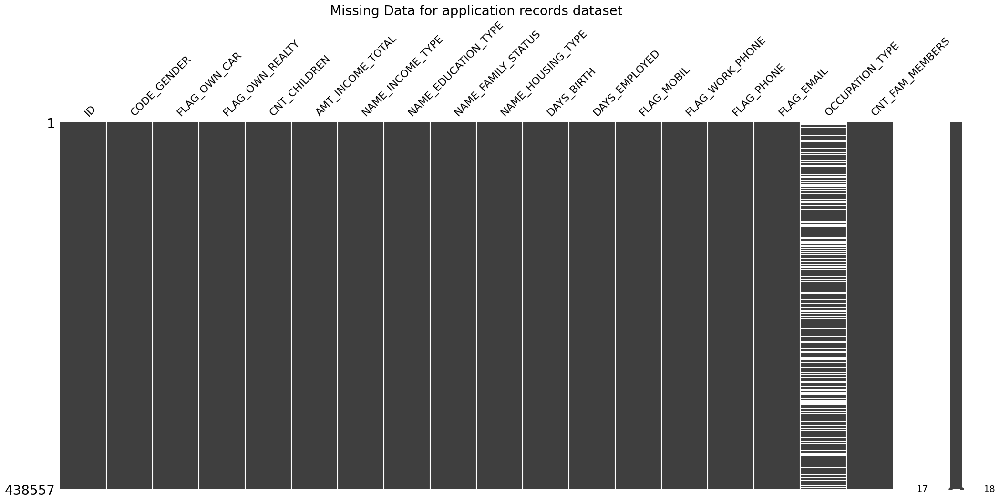

In [56]:
plt_missing_1 = msno.matrix(data)
plt_missing_1.set_title("Missing Data for application records dataset",fontsize=20)

Text(0.5, 1.0, 'Missing Data for credit records dataset')

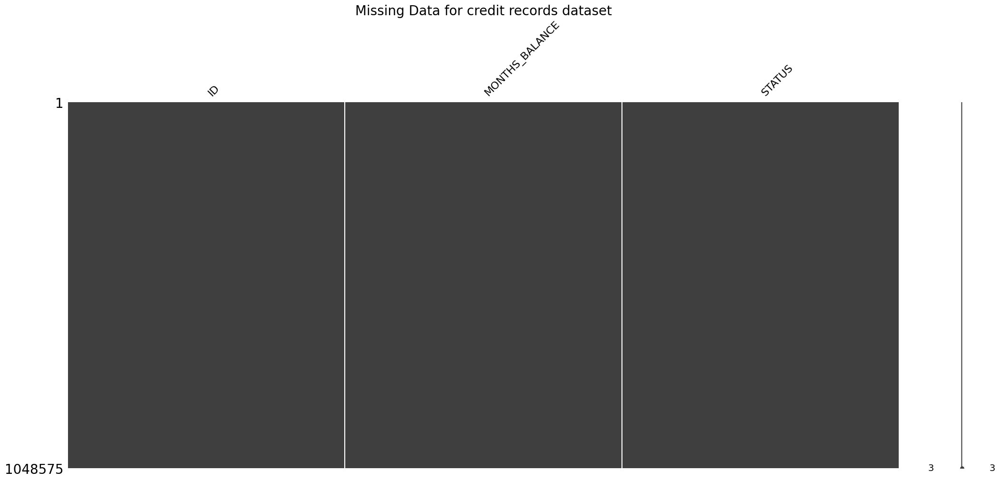

In [57]:
plt_missing_2 = msno.matrix(record)

plt_missing_2.set_title("Missing Data for credit records dataset",fontsize=20)

In [58]:
unique_counts = pd.DataFrame.from_records([(col, data[col].nunique()) for col in data.columns],
                          columns=['Column_Name', 'Num_Unique']) # finding unique values in each column
unique_counts

,Column_Name,Num_Unique
0,ID,438510
1,CODE_GENDER,2
2,FLAG_OWN_CAR,2
3,FLAG_OWN_REALTY,2
4,CNT_CHILDREN,12
5,AMT_INCOME_TOTAL,866
6,NAME_INCOME_TYPE,5
7,NAME_EDUCATION_TYPE,5
8,NAME_FAMILY_STATUS,5
9,NAME_HOUSING_TYPE,6


In [59]:
unique_counts = pd.DataFrame.from_records([(col, record[col].nunique()) for col in record.columns],
                          columns=['Column_Name', 'Num_Unique'])
unique_counts

,Column_Name,Num_Unique
0,ID,45985
1,MONTHS_BALANCE,61
2,STATUS,8


***Data Visualization***

In [60]:
#visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import random

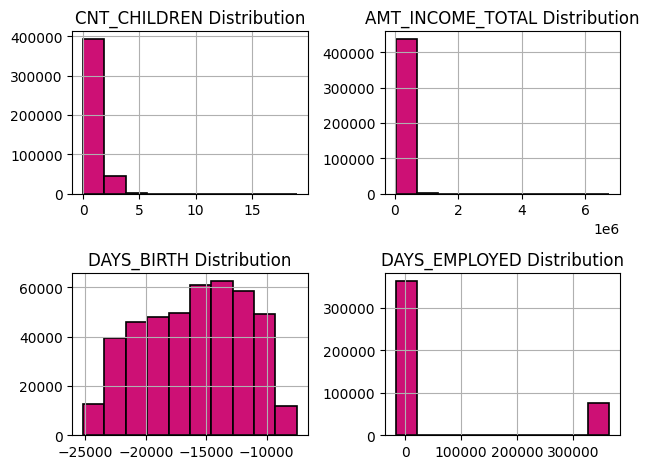

In [61]:

def draw_histograms(data, variables, n_rows, n_cols):
    fig=plt.figure()
    for i, var_name in enumerate(variables):
        ax=fig.add_subplot(n_rows,n_cols,i+1)
        data[var_name].hist(bins=10,ax=ax,color='#cd1075',edgecolor='black',linewidth=1.2)
        ax.set_title(var_name+" Distribution")
    fig.tight_layout()  # Improves appearance a bit.
    plt.show()

test = data[["CNT_CHILDREN","AMT_INCOME_TOTAL","DAYS_BIRTH","DAYS_EMPLOYED"]]
draw_histograms(test, test.columns, 2, 2)

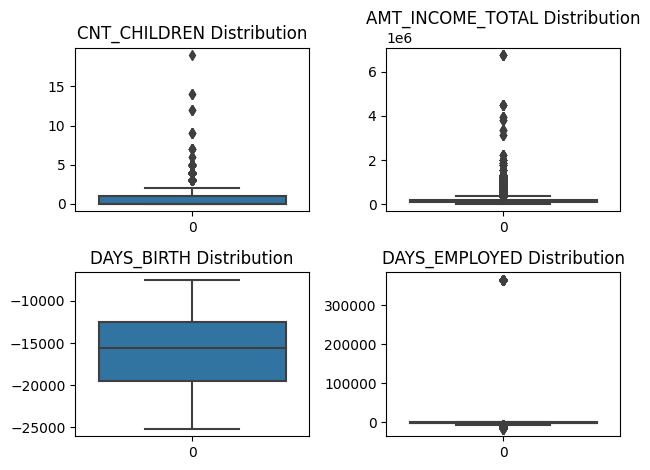

In [62]:
def draw_boxplot(data, variables, n_rows, n_cols):
    fig=plt.figure()
    for i, var_name in enumerate(variables):
        ax=fig.add_subplot(n_rows,n_cols,i+1)
        sns.boxplot(data[var_name])
        ax.set_title(var_name+" Distribution")
    fig.tight_layout()  # Improves appearance a bit.
    plt.show()

test = data[["CNT_CHILDREN","AMT_INCOME_TOTAL","DAYS_BIRTH","DAYS_EMPLOYED"]]
draw_boxplot(test, test.columns, 2, 2)

There are outliers in 2 columns.

CNT_CHILDREN

AMT_INCOME_TOTAL

In [63]:
#heatmap_dataset=data[["CNT_CHILDREN","AMT_INCOME_TOTAL","DAYS_BIRTH","DAYS_EMPLOYED"]]
#sns.heatmap(heatmap_dataset, cmap='YlGnBu')

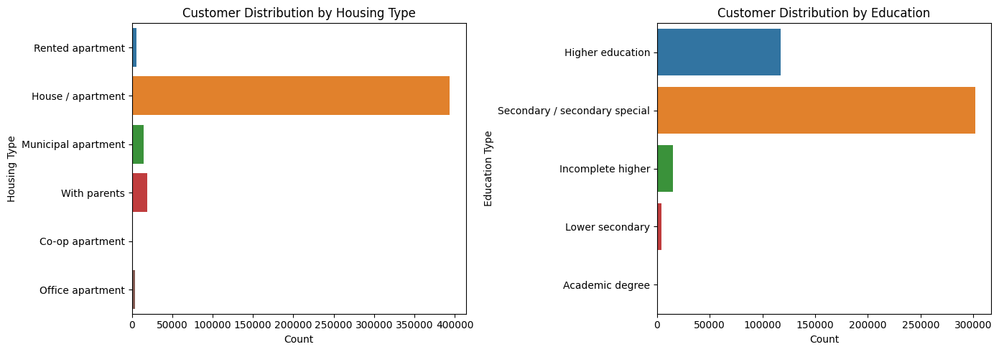

In [64]:
fig, axes = plt.subplots(1,2)

g1= sns.countplot(y=data.NAME_HOUSING_TYPE,linewidth=1.2, ax=axes[0])
g1.set_title("Customer Distribution by Housing Type")
g1.set_xlabel("Count")
g1.set_ylabel("Housing Type")

g2= sns.countplot(y=data.NAME_EDUCATION_TYPE, ax=axes[1])
g2.set_title("Customer Distribution by Education")
g2.set_xlabel("Count")
g2.set_ylabel("Education Type")

fig.set_size_inches(14,5)

plt.tight_layout()

plt.show()

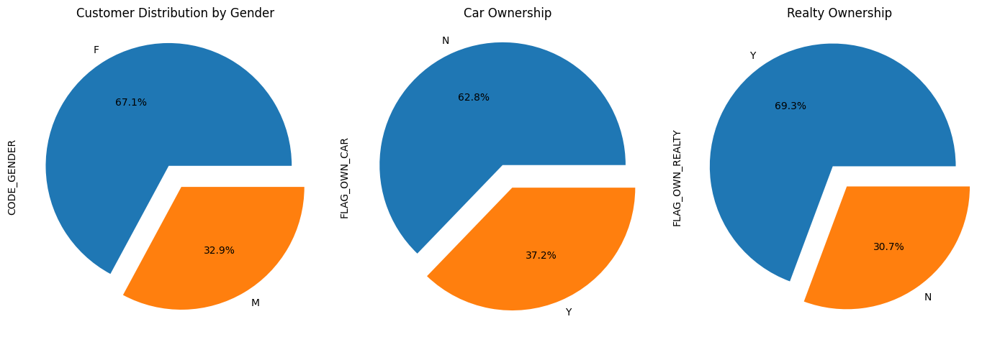

In [65]:
fig, axes = plt.subplots(1,3)

g1= data['CODE_GENDER'].value_counts().plot.pie(ax=axes[0],explode = [0.1,0.1],autopct='%1.1f%%')
g1.set_title("Customer Distribution by Gender")

g2= data['FLAG_OWN_CAR'].value_counts().plot.pie(ax=axes[1],explode = [0.1,0.1],autopct='%1.1f%%')
g2.set_title("Car Ownership")

g3= data['FLAG_OWN_REALTY'].value_counts().plot.pie(ax=axes[2],explode = [0.1,0.1],autopct='%1.1f%%')
g3.set_title("Realty Ownership")

fig.set_size_inches(14,5)

plt.tight_layout()

plt.show()

# **3 - Data Preprocessing & Feature Engineering**

In [66]:
#remove duplicate values and keep the last entry of the ID if its repeated.
data=data.drop_duplicates('ID', keep='last')
#the occupation type has missing values, we dropped them.
data.drop('OCCUPATION_TYPE', axis=1, inplace=True) 

In [67]:
#object columns in dataset
object_columns = data.columns[data.dtypes =='object'].tolist() 
unique_counts = pd.DataFrame.from_records([(col, data[object_columns][col].nunique()) for col in data[object_columns].columns],
                          columns=['Column_Name', 'Num_Unique']).sort_values(by=['Num_Unique'])

unique_counts #unique counts for object columns 

,Column_Name,Num_Unique
0,CODE_GENDER,2
1,FLAG_OWN_CAR,2
2,FLAG_OWN_REALTY,2
3,NAME_INCOME_TYPE,5
4,NAME_EDUCATION_TYPE,5
5,NAME_FAMILY_STATUS,5
6,NAME_HOUSING_TYPE,6


We have filtered the columns that have non numeric values to see if they are useful. We will convert them numeric.

In [68]:
#renaming columns

data.rename(columns={"CODE_GENDER":"Gender","FLAG_OWN_CAR":"Own_Car","FLAG_OWN_REALTY":"Own_Realty",
                     "CNT_CHILDREN":"Children_Count","AMT_INCOME_TOTAL":"Income","NAME_EDUCATION_TYPE":"Education",
                     "NAME_FAMILY_STATUS":"Family_Status","NAME_HOUSING_TYPE":"Housing_Type","DAYS_BIRTH":"Birthday",
                     "DAYS_EMPLOYED":"Employment_Date","FLAG_MOBIL":"Own_Mobile","FLAG_WORK_PHONE":"Own_Work_Phone",
                     "FLAG_PHONE":"Own_Phone","FLAG_EMAIL":"Own_Email","CNT_FAM_MEMBERS":"Family_Member_Count",
                    "NAME_INCOME_TYPE":"Income_Type"},inplace=True)

In [69]:
#merge to record data
open_month=pd.DataFrame(record.groupby(["ID"])["MONTHS_BALANCE"].agg(min))
open_month=open_month.rename(columns={'MONTHS_BALANCE':'begin_month'}) 
customer_data=pd.merge(data,open_month,how="left",on="ID")

In [70]:
customer_data.head()

,ID,Gender,Own_Car,Own_Realty,Children_Count,Income,Income_Type,Education,Family_Status,Housing_Type,Birthday,Employment_Date,Own_Mobile,Own_Work_Phone,Own_Phone,Own_Email,Family_Member_Count,begin_month
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,2.0,-15.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,2.0,-14.0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,2.0,-29.0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,1.0,-4.0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,1.0,-26.0


In [71]:
#converting categoric features into numeric
customer_data["Gender"] =  customer_data['Gender'].replace(['F','M'],[0,1])
customer_data["Own_Car"] = customer_data["Own_Car"].replace(["Y","N"],[1,0])
customer_data["Own_Realty"] = customer_data["Own_Realty"].replace(["Y","N"],[1,0])
customer_data["Is_Working"] = customer_data["Income_Type"].replace(["Working","Commercial associate","State servant","Pensioner","Student"],[1,1,1,0,0])

customer_data["In_Relationship"] = customer_data["Family_Status"].replace(["Civil marriage","Married","Single / not married",
                                                                          "Separated","Widow"],[1,1,0,0,0])

housing_type = {'House / apartment' : 'House / apartment',
                   'With parents': 'With parents',
                    'Municipal apartment' : 'House / apartment',
                    'Rented apartment': 'House / apartment',
                    'Office apartment': 'House / apartment',
                    'Co-op apartment': 'House / apartment'}

customer_data["Housing_Type"] = customer_data['Housing_Type'].map(housing_type)

family_status = {'Single / not married':'Single',
                     'Separated':'Single',
                     'Widow':'Single',
                     'Civil marriage':'Married',
                    'Married':'Married'}

customer_data["Family_Status"] = customer_data["Family_Status"].map(family_status)

education_type = {'Secondary / secondary special':'secondary',
                     'Lower secondary':'secondary',
                     'Higher education':'Higher education',
                     'Incomplete higher':'Higher education',
                     'Academic degree':'Academic degree'}

customer_data["Education"] = customer_data["Education"].map(education_type)

income_type = {'Commercial associate':'Working',
                  'State servant':'Working',
                  'Working':'Working',
                  'Pensioner':'Pensioner',
                  'Student':'Student'}

customer_data["Income_Type"] = customer_data["Income_Type"].map(income_type)

customer_data["Household_Size"] = customer_data["Children_Count"] + customer_data["In_Relationship"].apply(lambda x: 2 if x==1 else 1)

customer_data["Age"] = round((customer_data.Birthday/365)*-1)

customer_data["Experience"] = customer_data.Employment_Date/365
customer_data['Experience']=customer_data['Experience'].apply(lambda v : int(v*-1) if v <0 else 0)

customer_data=customer_data.drop(columns=['Employment_Date','Birthday','Children_Count'])

customer_data= pd.get_dummies(customer_data, columns=['Income_Type', 'Education','Family_Status',"Housing_Type"])

In [72]:
customer_data.head()

,ID,Gender,Own_Car,Own_Realty,Income,Own_Mobile,Own_Work_Phone,Own_Phone,Own_Email,Family_Member_Count,...,Income_Type_Pensioner,Income_Type_Student,Income_Type_Working,Education_Academic degree,Education_Higher education,Education_secondary,Family_Status_Married,Family_Status_Single,Housing_Type_House / apartment,Housing_Type_With parents
0,5008804,1,1,1,427500.0,1,1,0,0,2.0,...,0,0,1,0,1,0,1,0,1,0
1,5008805,1,1,1,427500.0,1,1,0,0,2.0,...,0,0,1,0,1,0,1,0,1,0
2,5008806,1,1,1,112500.0,1,0,0,0,2.0,...,0,0,1,0,0,1,1,0,1,0
3,5008808,0,0,1,270000.0,1,0,1,1,1.0,...,0,0,1,0,0,1,0,1,1,0
4,5008809,0,0,1,270000.0,1,0,1,1,1.0,...,0,0,1,0,0,1,0,1,1,0


In [73]:
print(customer_data.shape)
print(customer_data.columns)
print(' mean of Incomes :\n----------------\n',customer_data['Income'].describe())
print(customer_data['Income'].skew())
print(' mean of Age :\n----------------\n',customer_data['Age'].describe())
print(customer_data['Age'].skew())

(438510, 26)
Index(['ID', 'Gender', 'Own_Car', 'Own_Realty', 'Income', 'Own_Mobile',
       'Own_Work_Phone', 'Own_Phone', 'Own_Email', 'Family_Member_Count',
       'begin_month', 'Is_Working', 'In_Relationship', 'Household_Size', 'Age',
       'Experience', 'Income_Type_Pensioner', 'Income_Type_Student',
       'Income_Type_Working', 'Education_Academic degree',
       'Education_Higher education', 'Education_secondary',
       'Family_Status_Married', 'Family_Status_Single',
       'Housing_Type_House / apartment', 'Housing_Type_With parents'],
      dtype='object')
 mean of Incomes :
----------------
 count    4.385100e+05
mean     1.875209e+05
std      1.100807e+05
min      2.610000e+04
25%      1.215000e+05
50%      1.611000e+05
75%      2.250000e+05
max      6.750000e+06
Name: Income, dtype: float64
8.835772702973689
 mean of Age :
----------------
 count    438510.000000
mean         43.833716
std          11.472841
min          21.000000
25%          34.000000
50%          43.

Income follows a heighly skewd distribution

**We will look at numeric columns to see if there is anything that needs to be changed.**

In [76]:
other_numerical_cols = ["Income","Age","Experience","Household_Size"]

fig = make_subplots(rows=2, cols=2, start_cell="bottom-left",
                   subplot_titles=("Income", "Age", "Experience", "Family Member Count"))

fig.add_trace(go.Box(x=customer_data.Income, name='Income',boxmean=True),row=1,col=1)
fig.add_trace(go.Box(x=customer_data.Age, name='Age', boxmean=True), row=1, col=2)
fig.add_trace(go.Box(x=customer_data.Experience, name='Experience', boxmean=True), row=2, col=1)
fig.add_trace(go.Box(x=customer_data.Household_Size, name="Family Member Count", boxmean=True),row=2, col=2)

fig.show()



As seen above, there are some outliers values in children count, family member count, income and employment rate columns

We need to remove these outliers to make sure they do not affect our model results.
We will now remove these outliers by using z scores.

In [77]:
def calculate_z_scores(df, cols):
    for col in cols:
        df[col+"_z_score"] = (df[col] - df[col].mean())/df[col].std()
    return df

df_2 = calculate_z_scores(df = customer_data, cols = ["Income","Experience","Household_Size"])


#removing outliers
filter_2 = df_2.Household_Size_z_score.abs() <= 3.5
filter_3 = df_2.Experience_z_score.abs() <= 3.5
filter_4 = df_2.Income_z_score.abs() <= 3.5

customer_apps = df_2[filter_2 & filter_3 & filter_4]

customer_apps.drop(columns= ["Income_z_score","Experience_z_score","Household_Size_z_score"],inplace=True)

In [78]:
other_numerical_cols = ["Income","Age","Experience","Family_Member_Count"]

fig = make_subplots(rows=2, cols=2, start_cell="bottom-left",
                   subplot_titles=("Income", "Age", "Experience", "Family Member Count"))

fig.add_trace(go.Box(x=customer_apps.Income, name='Income',boxmean=True),row=1,col=1)
fig.add_trace(go.Box(x=customer_apps.Age, name='Age', boxmean=True), row=1, col=2)
fig.add_trace(go.Box(x=customer_apps.Experience, name='Experience', boxmean=True), row=2, col=1)
fig.add_trace(go.Box(x=customer_apps.Household_Size, name="Family Member Count", boxmean=True),row=2, col=2)

fig.show()